In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

In [73]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score


In [74]:
fake = pd.read_csv('https://raw.githubusercontent.com/siddhant-1410/Fake_New_Classifier/main/data/Fake.csv')

In [75]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [76]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [77]:
fake['subject'].value_counts()

,count
subject,
News,9050
politics,6841
left-news,4459
Government News,1570
US_News,783
Middle-east,778


<Axes: xlabel='subject', ylabel='count'>

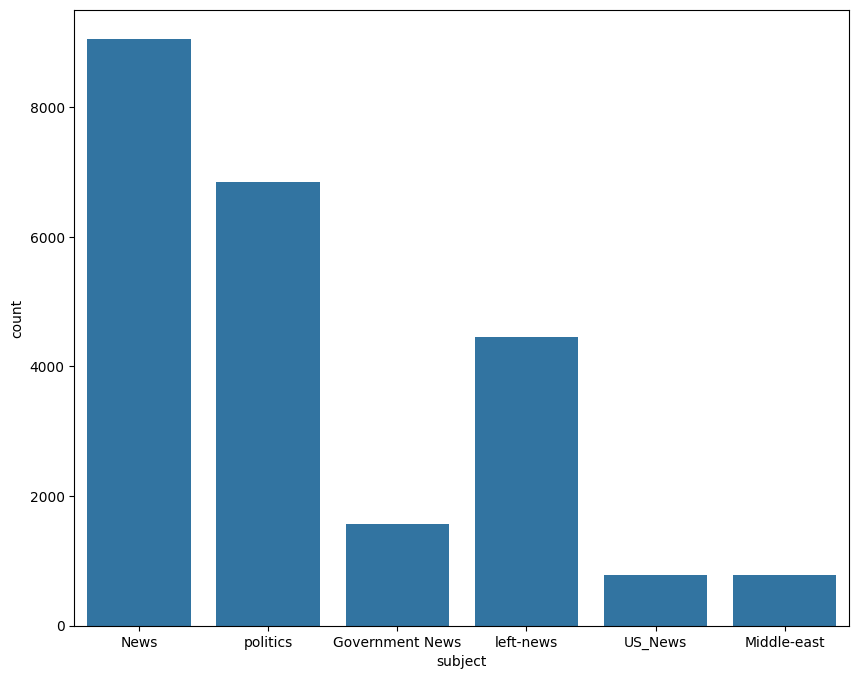

In [78]:
plt.figure(figsize=(10,8))
sns.countplot(x='subject',data=fake)

## **Word Cloud**

In [79]:
text=' '.join(fake['text'].tolist())

In [80]:
wordcloud = WordCloud().generate(text)

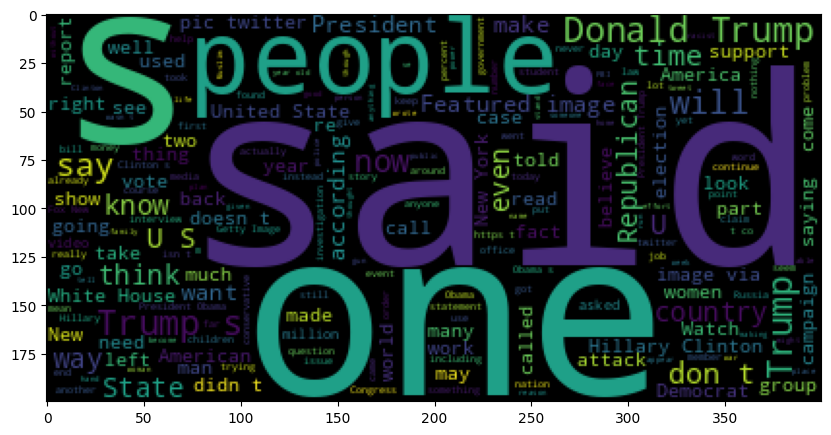

In [81]:
plt.figure(figsize=(10,8))
plt.imshow(wordcloud)

## ***Real News Dataset***

In [82]:
real = pd.read_csv('https://raw.githubusercontent.com/siddhant-1410/Fake_New_Classifier/main/data/True.csv')

In [83]:
text=' '.join(real['text'].tolist())

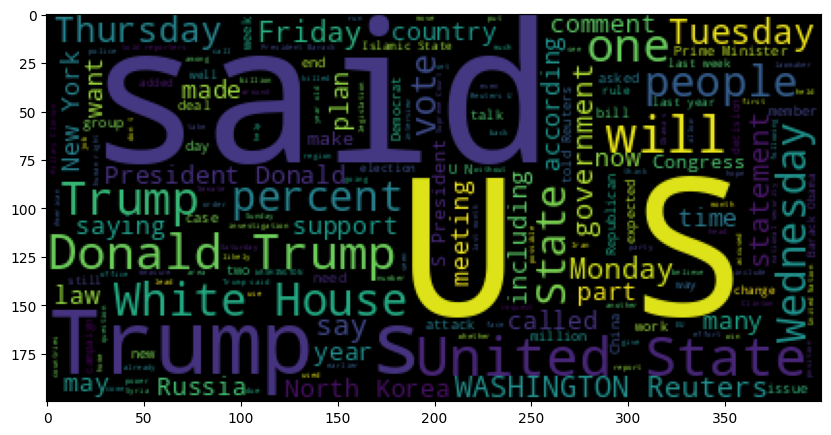

In [84]:
wordcloud = WordCloud().generate(text)
plt.figure(figsize=(10,8))
plt.imshow(wordcloud)

In [85]:
real.sample(5)

,title,text,subject,date
12700,Palestinian president says U.S. can no longer ...,GAZA (Reuters) - The United States cannot brok...,worldnews,"December 8, 2017"
13309,"One dead, scores arrested in unrest over delay...",TEGUCIGALPA (Reuters) - At least one protester...,worldnews,"December 1, 2017"
2086,Pakistani army says it has acted against milit...,ISLAMABAD (Reuters) - Pakistan has taken actio...,politicsNews,"August 21, 2017"
4637,Senator seeks ethics probe of Mnuchin's 'Lego ...,WASHINGTON (Reuters) - The top Democrat on the...,politicsNews,"March 28, 2017"
20833,Trump says military action against North Korea...,WASHINGTON (Reuters) - U.S. President Donald T...,worldnews,"September 6, 2017"


In [86]:
unknown_publishers=[]
for index, row in enumerate(real.text.values):
  try:
    record = row.split('-',maxsplit=1)
    record[1]
    assert (len(record[0])<120)

  except:
    unknown_publishers.append(index)



In [87]:
len(unknown_publishers)

222

In [88]:
real.iloc[unknown_publishers].text

,text
7,The following statements were posted to the ve...
8,The following statements were posted to the ve...
12,The following statements were posted to the ve...
13,The following statements were posted to the ve...
14,"(In Dec. 25 story, in second paragraph, corre..."
...,...
20135,(Story corrects to million from billion in pa...
20500,"(This Sept 8 story corrects headline, clarifi..."
20667,"(Story refiles to add dropped word not , in ..."
21246,(Story corrects third paragraph to show Mosul...


In [89]:
real.iloc[8970]

,8970
title,Graphic: Supreme Court roundup
text,
subject,politicsNews
date,"June 16, 2016"


In [90]:
# real = real.drop(8970,axis=0)

In [91]:
publisher=[]
temp_text = []

for index, row in enumerate(real.text.values):
  if index in unknown_publishers:
    temp_text.append(row)
    publisher.append('Unknown')
  else:
    record = row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    temp_text.append(record[1].strip())

In [92]:
real['publisher'] = publisher
real['text'] = temp_text

In [93]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [94]:
real.shape


(21417, 5)

In [95]:
empty_fake_index = [index for index, text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [96]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [97]:
real['text'] = real['title'] + " " + real['text']
fake['text'] = fake['title'] + " " + fake['text']

In [98]:
real['text'] = real['text'].apply(lambda x: str(x).lower())
fake['text'] = fake['text'].apply(lambda x: str(x).lower())

In [99]:
real

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...","as u.s. budget fight looms, republicans flip t...",politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,u.s. military to accept transgender recruits o...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,senior u.s. republican senator: 'let mr. muell...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,fbi russia probe helped by australian diplomat...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,trump wants postal service to charge 'much mor...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)
...,...,...,...,...,...
21412,'Fully committed' NATO backs new U.S. approach...,'fully committed' nato backs new u.s. approach...,worldnews,"August 22, 2017",BRUSSELS (Reuters)
21413,LexisNexis withdrew two products from Chinese ...,lexisnexis withdrew two products from chinese ...,worldnews,"August 22, 2017",LONDON (Reuters)
21414,Minsk cultural hub becomes haven from authorities,minsk cultural hub becomes haven from authorit...,worldnews,"August 22, 2017",MINSK (Reuters)
21415,Vatican upbeat on possibility of Pope Francis ...,vatican upbeat on possibility of pope francis ...,worldnews,"August 22, 2017",MOSCOW (Reuters)


In [100]:
real['class'] = 1
fake['class'] = 0

In [101]:
real = real[['text','class']]
fake = fake[['text','class']]

In [102]:
# import pandas as pd

# Concatenate the DataFrames instead of using append
data = pd.concat([real, fake], ignore_index=True)

In [103]:
data.sample(5)

,text,class
38486,breaking: putin tramples obama’s imaginary red...,0
23781,‘hundreds’ donated to planned parenthood in r...,0
1736,trump ally stone to testify to house panel pro...,1
2638,trump picks former u.n. spokesman grenell for ...,1
17048,kurdish forces still control khurmala oil fiel...,1


In [104]:
# import re
# import pandas as pd


def preprocess_text(text):
    # Remove special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Convert to lowercase
    text = text.lower()
    # Remove extra whitespace
    text = ' '.join(text.split())
    return text


data['text'] = data['text'].apply(preprocess_text)

# Now, your text data is preprocessed and can be used for further analysis or model training


In [105]:
data.head()

,text,class
0,as us budget fight looms republicans flip thei...,1
1,us military to accept transgender recruits on ...,1
2,senior us republican senator let mr mueller do...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much more...,1


In [106]:
import gensim

In [107]:
y = data['class'].values

In [108]:
y


array([1, 1, 1, ..., 0, 0, 0])

In [109]:
X = [d.split() for d in data['text'].tolist()]

In [110]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues', 'such',

In [111]:
DIM = 100
w2v_model = gensim.models.Word2Vec(sentences=X, vector_size=DIM, window=10, min_count=1)

In [112]:
len(w2v_model.wv.key_to_index)  # Use key_to_index to get the vocabulary size

215329

In [113]:
w2v_model.wv.most_similar('bjp')

[('mhp', 0.7189963459968567),
 ('bharatiya', 0.6967757344245911),
 ('janata', 0.6956852674484253),
 ('erc', 0.6558315753936768),
 ('mdp', 0.65579754114151),
 ('thirdplace', 0.6555747389793396),
 ('mpla', 0.6532185673713684),
 ('morena', 0.6448597311973572),
 ('esquerra', 0.6422322988510132),
 ('luigi', 0.6389285326004028)]

In [114]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [115]:
X = tokenizer.texts_to_sequences(X)

In [116]:
X

[[18,
  30,
  470,
  478,
  10432,
  133,
  7921,
  40,
  1342,
  5072,
  1,
  419,
  3,
  4,
  301,
  79,
  6180,
  6,
  1,
  30,
  189,
  29,
  768,
  26,
  272,
  9,
  4,
  1086,
  2901,
  3,
  1,
  124,
  938,
  2,
  446,
  9,
  184,
  1167,
  175,
  397,
  4,
  1342,
  301,
  8,
  340,
  5,
  1087,
  470,
  7637,
  6,
  6,
  1723,
  16,
  4,
  3348,
  7726,
  141,
  164,
  320,
  133,
  30,
  790,
  908,
  7638,
  671,
  8,
  1917,
  473,
  1,
  368,
  1720,
  4,
  556,
  586,
  8,
  168,
  689,
  50,
  407,
  28,
  16870,
  2,
  89,
  1320,
  66,
  6,
  409,
  60,
  32,
  771,
  25,
  1,
  7922,
  8,
  203,
  407,
  39,
  1402,
  349,
  2,
  915,
  4,
  168,
  470,
  6,
  4,
  478,
  303,
  2,
  22,
  1910,
  2,
  80,
  426,
  170,
  18,
  312,
  208,
  107,
  18,
  1,
  513,
  567,
  97,
  1738,
  1465,
  6,
  50,
  133,
  39,
  1054,
  2,
  376,
  348,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  380,
  470,
  945,
  6,
  169,
  689,
  110,
  197,
  62,
  182,


In [117]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'he': 12,
 'said': 13,
 'trump': 14,
 'it': 15,
 'with': 16,
 'was': 17,
 'as': 18,
 'his': 19,
 'by': 20,
 'has': 21,
 'be': 22,
 'have': 23,
 'not': 24,
 'from': 25,
 'this': 26,
 'at': 27,
 'are': 28,
 'who': 29,
 'us': 30,
 'an': 31,
 'they': 32,
 'i': 33,
 'but': 34,
 'we': 35,
 'would': 36,
 'president': 37,
 'about': 38,
 'will': 39,
 'their': 40,
 'you': 41,
 'had': 42,
 't': 43,
 'been': 44,
 'were': 45,
 'people': 46,
 'more': 47,
 'or': 48,
 'after': 49,
 'which': 50,
 'she': 51,
 'her': 52,
 'one': 53,
 'if': 54,
 'its': 55,
 'out': 56,
 'all': 57,
 'what': 58,
 'state': 59,
 'when': 60,
 'new': 61,
 'also': 62,
 'up': 63,
 'there': 64,
 'no': 65,
 'over': 66,
 'house': 67,
 'donald': 68,
 'our': 69,
 'clinton': 70,
 'states': 71,
 'obama': 72,
 'government': 73,
 'can': 74,
 'just': 75,
 'him': 76,
 'so': 77,
 'than': 78,
 'republican': 79,
 'other': 80,
 'so

In [118]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])

1525

In [119]:
maxlen = 1000
X = pad_sequences(X,maxlen=maxlen)

In [120]:
len(X[100])

1000

In [121]:
vocab_size = len(tokenizer.word_index) + 1

In [122]:
vocab = tokenizer.word_index

In [123]:
def get_weight_matrix(model):
  weight_matrix =  np.zeros((vocab_size,DIM))

  for word , i in vocab.items():
    weight_matrix[i] = model.wv[word]
  return weight_matrix

In [124]:
embedding_vectors = get_weight_matrix(w2v_model)


In [125]:
embedding_vectors.shape

(215330, 100)

In [126]:
model = Sequential()
model.add(Embedding(vocab_size,output_dim=DIM,weights=[embedding_vectors],input_length=maxlen,trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1,activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [127]:

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)              │ ?                           │      21,533,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,533,000 (82.14 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 21,533,000 (82.14 MB)

In [128]:
X_train,X_test,y_train,y_test = train_test_split(X,y)

In [137]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.9909 - loss: 0.0269 - val_accuracy: 0.9931 - val_loss: 0.0228
Epoch 2/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.9883 - val_loss: 0.0344
Epoch 3/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.9942 - val_loss: 0.0227
Epoch 4/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.9975 - loss: 0.0077 - val_accuracy: 0.9885 - val_loss: 0.0409
Epoch 5/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 29s 39ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.9938 - val_loss: 0.0242
Epoch 6/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.9995 - loss: 0.0021 - val_accuracy: 0.9936 - val_loss: 0.0254


In [138]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)              │ (None, 1000, 100)           │      21,533,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 128)                 │         117,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,885,133 (83.49 MB)

 Trainable params: 117,377 (458.50 KB)

 Non-trainable params: 21,533,000 (82.14 MB)

 Optimizer params: 234,756 (917.02 KB)

In [139]:
y_pred = (model.predict(X_test)>=0.5).astype(int)

351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step


In [140]:
accuracy_score(y_test,y_pred)

0.9938530066815144

In [141]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      5841
           1       0.99      1.00      0.99      5384

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [134]:
# import pickle

# # Save the tokenizer
# with open('tokenizer.pickle', 'wb') as handle:
#     pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [135]:
# # Save the model in .h5 format
# model.save('lstm_model.h5')


In [136]:
# from google.colab import files
# files.download('lstm_model.h5')
# files.download('tokenizer.pickle')
